# MitCOM Complexes

Using protein profiles from a complexome dataset and a set of profile components 
(identified via Gaussian mixture model fits), this code finds and visualizes 
all potential profile regions that highly correlate with each other.

In the final interactive t-SNE visualization, data points of high-correlating regions 
(potentially belonging to the same complex) are plotted *very* close to each other, 
while low-correlating and non-related regions are further apart.

In [1]:
# Enable during development of external libraries
# %load_ext autoreload
# %autoreload 2

In [2]:
from datetime import datetime
from pathlib import Path

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from ipywidgets import interactive, widgets
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt

from mitcom import ioutil, components, rois, similarity
from mitcom.helpers import timing

%matplotlib inline

## Data Files

In [3]:
datadir = Path('data')
protein_abundance_file = datadir / 'abundances.tsv'
components_file = datadir / 'fitted-components.tsv'
predefined_complexes_file = datadir / 'known-complexes.tsv'
#  whitelist: set to None to disable
protein_whitelist_file = datadir / 'protein-names-whitelist.txt'

## Settings

In [49]:
# Minimum correlation coefficient between a component and a profile
# section to be considered and become a ROI
seed_match_min_r = 0.95

# Sigma factor/scale defines component width
sigma_scale = 2.5
max_sigma = None

# If set to True, components that do not have their FWHM-area inside
# the strip range will be ignored
require_fwhm_in_range = True

# strip species part from UniProt entry names
protein_name_transformer = lambda s: s.split('_')[0]

# if True, creates zip file with all result data frames (inkl. t-SNE) on each run
save_results = True

In [42]:
# matplotlib settings
%config InlineBackend.figure_format = 'svg'
plt.rcParams['figure.figsize'] = 5, 3
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 300

# Pandas settings
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', 2000)

# Numpy settings
np.seterr(invalid='ignore')
np.set_printoptions(linewidth=200)

# Applying a global config to plots inside a FigureWidget doesn't work.
# See https://github.com/plotly/plotly.py/issues/1074
#
# cfg = pio.renderers['jupyterlab'].config
# cfg['displayModeBar'] = False
# cfg['toImageButtonOptions'] = {
#     'format': 'png', # one of png, svg, jpeg, webp
#     'filename': 'tsne',
#     'height': 2000,
#     'width': 2000,
#     'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
# }


## Load and filter data

In [43]:
df_p = ioutil.load_abundances(protein_abundance_file, protein_name_transform=protein_name_transformer)
df_c = ioutil.load_components(components_file, protein_name_transform=protein_name_transformer)

print(f'Loaded {len(df_p)} profiles from file')
print(f'Loaded {len(df_c)} components from file')

if protein_whitelist_file:
	proteins = ioutil.load_column(protein_whitelist_file)
	if protein_name_transformer:
		proteins = list(map(protein_name_transformer, proteins))
	print(f'Loaded {len(proteins)} protein names from whitelist file')
	df_p = df_p.loc[proteins, :]
	if len(df_p) != len(proteins):
		raise ValueError(
			'Some proteins from whitelist file have no profile values')

df_c = components.filter_components(
    df_c,
    sigma_scale=sigma_scale,
    n_strips=len(df_p.columns),
    max_sigma=max_sigma,
    require_fwhm_in_range=require_fwhm_in_range
)
print('Final number of protein profiles:', len(df_p))
print('Final number of components:', len(df_c))

# Load pre-defined complexes
df_compl = ioutil.load_complexes(predefined_complexes_file, all_seeds=df_c.index)

Loaded 954 profiles from file
Loaded 4071 components from file
Loaded 906 protein names from whitelist file
Ignore 0 components with invalid start/end values
Ignore 494 components having their FWHM-range start before before strip 0
Ignore 312 components having their FWHM-range end after strip 245
Final number of protein profiles: 906
Final number of components: 3265


In [44]:
############### TODO: Fix this in original data file #################

# remove duplicate components
df_c = df_c.drop_duplicates(subset=['Protein', 'Component'])

######################################################################

In [45]:
# derived variables
n_strips = len(df_p.columns)
n_proteins = len(df_p)
n_components = len(df_c)
xx = np.arange(n_strips)

## Data preview

### Profiles

In [46]:
df_p.head()

Slice,1,2,3,4,5,6,7,8,9,10,...,236,237,238,239,240,241,242,243,244,245
Protein,,,,,,,,,,,,,,,,,,,,,
HSP60,52546206,50243155,49897991,49786122,50268992,50119376,50613243,49376577,47807523,43948176,...,3059003,3009435,2977313,2873895,2654954,2471933,2337864,2236909,2167097,2121879
ODO1,6164147,5574462,5373584,5226095,5579182,6063344,6932673,8069301,9704591,12127660,...,1013569,1032095,1009915,1035604,977208,963029,932104,941196,938244,922986
ATPA,200324877,190788747,180546201,177376271,169895033,160805913,150762049,150825499,145072057,155245106,...,44236468,42470890,42387230,40804641,37806035,36404196,35795884,36301775,37713490,39613044
ATPB,149603681,142788894,137232083,132831890,128041844,118300751,108858186,99143985,89198069,82935622,...,32285313,32553985,33912078,33593205,32480720,32013646,31880136,31238748,31798680,31340067
ALDH4,118949711,115767222,114945349,113501311,110484080,102978427,95112362,93118628,86955847,88353294,...,9625090,9478851,9360866,9018693,8287611,7873617,7416909,7085333,6765047,6584878


### Component fits

In [47]:
df_c.head()

,Protein,Component,Center,PopAbund,Sigma,Height,Share,x0,x1
ComponentId,,,,,,,,,
6PGD1-C2,6PGD1,P2,193.000000,3283657,10.02,0.09,0.13,167,219
6PGD1-C3,6PGD1,P3,200.000000,4982534,4.41,0.25,0.20,188,212
6PGD1-C4,6PGD1,P4,209.813727,16773897,4.66,0.97,0.67,198,222
AATM-C2,AATM,P2,120.010308,8710445,2.23,0.75,0.06,114,126
AATM-C3,AATM,P3,125.000009,18660215,20.00,0.18,0.13,75,176


### Pre-defined complexes

In [48]:
df_compl.head()

,component,complex,fig,seed,prot
0,PHB1-C3,F1D_PHB,F1D,PHB1@PHB1-C3,PHB1
1,PHB2-C3,F1D_PHB,F1D,PHB2@PHB2-C3,PHB2
2,ODO1-C2,F1D_ODO,F1D,ODO1@ODO1-C2,ODO1
3,ODO2-C2,F1D_ODO,F1D,ODO2@ODO2-C2,ODO2
4,ATPA-C4,F1D_ATP#1,F1D,ATPA@ATPA-C4,ATPA


## Calculation

### Identify ROIs

In [50]:
correlate_with = 'profile'  # 'fit' or 'profile'

with timing() as t:
    roi_generator = rois.find(df_p, df_c, xx, correlate_with, rmin=seed_match_min_r)
    df_rois = pd.DataFrame(roi_generator).set_index('roi').sort_index()
    df_rois = df_rois.merge(df_c[['Sigma', 'x0', 'x1']], left_on='seed', right_index=True)
    df_rois.columns = [c.lower() for c in df_rois.columns]
    df_rois = df_rois.sort_values(['prot', 'x0', 'x1'])

print(f'Identified {len(df_rois)} ROIs in {len(df_p)} profiles')

C:\Dev\complexomics-mitcom\.venv\lib\site-packages\numpy\lib\function_base.py:495: RuntimeWarning:

Mean of empty slice.

C:\Dev\complexomics-mitcom\.venv\lib\site-packages\numpy\lib\function_base.py:2821: RuntimeWarning:

Degrees of freedom <= 0 for slice

C:\Dev\complexomics-mitcom\.venv\lib\site-packages\numpy\lib\function_base.py:2680: RuntimeWarning:

divide by zero encountered in true_divide



Runtime: 0.0m 43.8s
Identified 85531 ROIs in 906 profiles


In [51]:
df_rois.head()

,prot,seed,abund,r,sigma,x0,x1
roi,,,,,,,
6PGD1@YG5L-C4,6PGD1,YG5L-C4,909160,0.951048,13.82,136,206
6PGD1@SYEM-C4,6PGD1,SYEM-C4,1052941,0.961776,15.19,139,215
6PGD1@RM24-C5,6PGD1,RM24-C5,1052941,0.968247,14.45,140,214
6PGD1@ERG27-C5,6PGD1,ERG27-C5,340501,0.990663,11.00,141,197
6PGD1@ACON2-C2,6PGD1,ACON2-C2,555307,0.957036,11.80,141,201


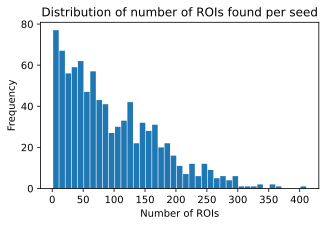

In [52]:
_s = df_rois.groupby('prot').agg('size')
ax = _s.plot.hist(
    bins=np.arange(_s.min(), _s.max() + 10, 10),
    rwidth=0.9,
    title='Distribution of number of ROIs found per seed',
)
ax.set(xlabel='Number of ROIs')
del _s
# plt.savefig('Distribution of number of ROIs found per seed.png')

### Normalize features values

In [53]:
if (df_rois['abund'] > 100).any():
    rois.normalize(df_rois)

sd: 0.10736886500317061 mean: 0.4857713041966006 lo: 0.21734914168867409 hi: 0.7541934667045271


<AxesSubplot: title={'center': 'Distribution of Abundance values (log+scaled)'}, ylabel='Frequency'>

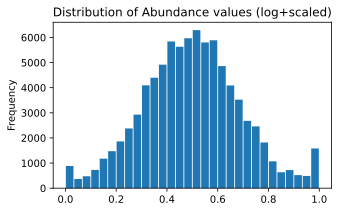

In [54]:
df_rois['abund'].plot.hist(bins=30, rwidth=0.9, title='Distribution of Abundance values (log+scaled)')
# plt.savefig('Distribution of Abundance values.png')

### Merge ROIs

Reducing the number of ROIs has major impact on complexity and runtime.

In [55]:
df_rois_merged = rois.merge(df_rois)

# add seed/complex marker
def get_complex(row):
    seeds = row.seed.split(',')
    mask = df_compl['prot'] == row.prot
    mask &= df_compl['component'].isin(seeds)
    cc = sorted(df_compl.loc[mask, 'complex'].unique())
    return ','.join(cc)

df_rois_merged['complex'] = df_rois_merged.apply(get_complex, axis=1)

df_rois_merged.head()

,prot,seed,abund,r,sigma,x0,x1,center,complex
roi,,,,,,,,,
6PGD1@[152-216],6PGD1,ETR1-C5,0.415944,0.017811,12.68,152,216,184.0,
6PGD1@[152-220],6PGD1,CH10-C4,0.415944,0.178423,13.25,152,220,186.0,
6PGD1@[141-197],6PGD1,ERG27-C5,0.302479,0.813251,11.00,141,197,169.0,
6PGD1@[141-201],6PGD1,ACON2-C2,0.351637,0.140727,11.80,141,201,171.0,
6PGD1@[136-206],6PGD1,YG5L-C4,0.401187,0.020950,13.82,136,206,171.0,


### Run t-SNE

In [56]:
# for development only:
# limit number of proteins by settings start and end index
n_min = 0
n_max = -1

distance_value_cols = ['x0', 'x1', 'abund', 'r']
perplexity = 15
metric = similarity.custom_dist

with timing() as t:
    tsne = TSNE(
        n_components=2,
        init="random",
        random_state=0,
        perplexity=perplexity,
        learning_rate="auto",
        n_iter=500,
        metric=metric,
        verbose=True,
        n_jobs=-1,
    )

    # data array will contain feature values followed by profile values
    # feature columns
    data = df_rois_merged.set_index('prot')[distance_value_cols]
    # placeholder column for ROI-to-ROI correlation coefficient (added later)
    data = data.assign(placeholder_col=0.0)
    # append profile values
    data = data.join(df_p, how='left')
    # slicing (for debugging)
    data = data.iloc[n_min:n_max]

    Y = tsne.fit_transform(data.to_numpy())

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Indexed 49111 samples in 0.051s...
[t-SNE] Computed neighbors for 49111 samples in 5286.328s...
[t-SNE] Computed conditional probabilities for sample 1000 / 49111
[t-SNE] Computed conditional probabilities for sample 2000 / 49111
[t-SNE] Computed conditional probabilities for sample 3000 / 49111
[t-SNE] Computed conditional probabilities for sample 4000 / 49111
[t-SNE] Computed conditional probabilities for sample 5000 / 49111
[t-SNE] Computed conditional probabilities for sample 6000 / 49111
[t-SNE] Computed conditional probabilities for sample 7000 / 49111
[t-SNE] Computed conditional probabilities for sample 8000 / 49111
[t-SNE] Computed conditional probabilities for sample 9000 / 49111
[t-SNE] Computed conditional probabilities for sample 10000 / 49111
[t-SNE] Computed conditional probabilities for sample 11000 / 49111
[t-SNE] Computed conditional probabilities for sample 12000 / 49111
[t-SNE] Computed conditional probabilities for 

In [57]:
df_tsne = pd.DataFrame(index=df_rois_merged.iloc[n_min:n_max].index, columns=['x', 'y'], data=Y)
df_tsne = df_tsne.join(df_rois_merged.iloc[n_min:n_max])
df_tsne

,x,y,prot,seed,abund,r,sigma,x0,x1,center,complex
roi,,,,,,,,,,,
6PGD1@[152-216],8.797375,28.811773,6PGD1,ETR1-C5,0.415944,0.017811,12.680,152,216,184.0,
6PGD1@[152-220],9.557395,30.132002,6PGD1,CH10-C4,0.415944,0.178423,13.250,152,220,186.0,
6PGD1@[141-197],-3.434489,-10.792330,6PGD1,ERG27-C5,0.302479,0.813251,11.000,141,197,169.0,
6PGD1@[141-201],30.761471,-0.407616,6PGD1,ACON2-C2,0.351637,0.140727,11.800,141,201,171.0,
6PGD1@[136-206],-60.494652,-27.862501,6PGD1,YG5L-C4,0.401187,0.020950,13.820,136,206,171.0,
...,...,...,...,...,...,...,...,...,...,...,...
ZRC1@[163-179],-59.907127,-12.115643,ZRC1,"ATC6-C8,CYM1-C3",0.525240,0.577488,2.735,163,179,171.0,
ZRC1@[158-178],-54.349697,-29.131592,ZRC1,ACH1-C5,0.529332,0.862812,3.810,158,178,168.0,
ZRC1@[146-173],-39.070011,-2.844593,ZRC1,SLS1-C6,0.470538,0.686732,5.190,146,173,159.5,


## Save results data

In [50]:
dataframes = {
    'df_tsne': df_tsne,
    'df_rois': df_rois,
    'df_rois_merged': df_rois_merged,
    'df_c': df_c,
    'df_p': df_p,
    'df_compl': df_compl,
}

def save_data():
    file_id = '_'.join([
        datetime.now().strftime('%Y-%m-%dT%H-%M-%S'),
        f'rmin{seed_match_min_r}',
        f'perplexity{perplexity}',
        f'sigmascale{sigma_scale}',
    ])

    storefile = datadir / 'export' / f'{file_id}.h5'
    storefile.parent.mkdir(exist_ok=True)

    ioutil.store_dataframes(dataframes, storefile)

save_data()

## Load results data

This is the entry point for t-SNE visualization of existing result files.

In [3]:
resultfile = r'c:\Users\Alex\Documents\Projekte\BNMS\YEAST-Mito\peak-component-correlation\export\2022-11-10T13-41-07_rmin0.95_perplexity15_sigmascale2.5.h5'
if resultfile:
    dataframes = ioutil.load_dataframes_hdf(resultfile)
    df_tsne = dataframes['df_tsne']
    df_compl = dataframes['df_compl']

## Visualization

Simple t-SNE visualization of all *Regions of Interest* based on their distance.

In [5]:
available_complexes = sorted(df_compl['complex'].unique())
available_complexes

['All Seeds',
 'F1D_ATP#1',
 'F1D_ATP#2',
 'F1D_ATP#3',
 'F1D_ODO',
 'F1D_PHB',
 'F1D_SDH',
 'F1D_TIM',
 'F1D_TIM9+10',
 'F1D_UPS',
 'F3A_OM',
 'F3A_TOM',
 'F3C_PHB',
 'F3E_COX',
 'F4A_TOM',
 'F5A_TOM',
 'S6A_SAM#1',
 'S6A_SAM#2',
 'S6A_SAM#3',
 'S6A_SAM#4',
 'S6B_TIM']

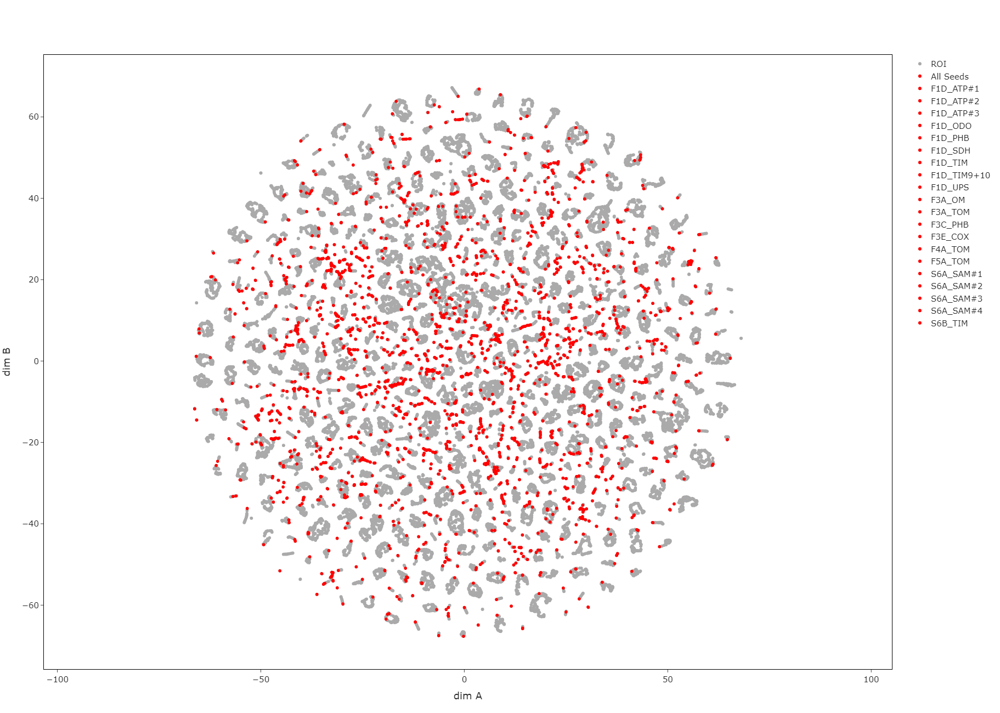

In [6]:
# our plotly template
pio.templates["publication"] = go.layout.Template(
    layout=dict(
        font_size=15,
        xaxis=dict(mirror=True, linecolor='#000'),
        yaxis=dict(mirror=True, linecolor='#000'),
    )
)

colors = px.colors.qualitative.G10

color_default = '#aaa' # colors[0]
color_seed = '#f00'  # colors[1]
color_selected = colors[0]
color_unselected = '#aaa'

marker_size = 6

w_out = widgets.Output()
w_out.clear_output()

df_plot = df_tsne.iloc[:].reset_index()

last_selector = None
all_selected_proteins = set()
plot_ranges_x = None
plot_ranges_y = None

have_clusters = 'cluster' in df_tsne

style_selected = {'marker': {'color': colors[0]}}
style_unselected = {'marker': {'color': '#aaa', 'opacity': 0.8}}

d = df_plot
x = d['x']
y = d['y']

hovertemplate = "<b>%{customdata[0]}</b>"

if have_clusters:
    customdata = d[['roi', 'cluster']]
    colors = px.colors.sample_colorscale("Turbo", len(d['cluster'].unique()))
    np.random.shuffle(colors)
    colors[0] = '#999'
    marker_color = d['cluster'],
    hovertemplate += "<br>Cluster %{customdata[1]}"
else:
    customdata = d[['roi']]
    marker_color = color_default

w_tsne = go.FigureWidget(
    go.Scattergl(
        x=x,
        y=y,
        mode='markers+text',
        name='ROI',
        hoverinfo='text',
        hovertemplate=hovertemplate,
        customdata=customdata,
        unselected=style_unselected,
        selected=style_selected,
        # showlegend=True,
        marker_color=marker_color,
        marker_colorscale=colors,
        marker_size=marker_size,
        # text=d['prot'],
        textposition="middle right",
    )
)

# add a trace for each pre-defined complex
complex_traces = []
for i, c in enumerate(available_complexes):
    seeds = df_compl.loc[df_compl['complex'] == c, 'seed'].to_numpy()
    mask = df_plot['complex'].str.contains(c, regex=False)
    # if mask.sum() == 0:
    #     print('No ROIs match complex', c)
    # idx = np.where(mask)[0]
    x = d.loc[mask, 'x']
    y = d.loc[mask, 'y']
    customdata = d.loc[mask, 'roi'].to_numpy()
    style_selected = {'marker': {'color': color_seed}}
    style_unselected = {'marker': {'color': color_seed, 'opacity': 0.8}}
    t = go.Scattergl(
        x=x,
        y=y,
        mode='markers',
        name=c,
        hoverinfo='text',
        hovertemplate=hovertemplate,
        customdata=customdata,
        unselected=style_unselected,
        selected=style_selected,
        marker_color=color_seed,
        # marker_symbol='diamond',
    )
    t.visible = True
    complex_traces.append(t)

w_tsne.add_traces(complex_traces)
w_tsne.update_layout(
    height=1300,
    width=1300,
    xaxis_title='dim A',
    yaxis_title='dim B',
    yaxis_scaleanchor='x',
    template='simple_white+publication',
    # showlegend=False,
)
w_tsne.show()
